# Where's Waldo?

Welcome to this notebook for finding where is Waldo. I remember when I was children I spent hours trying to find out where is Waldo. I had a lot of fun with these books but sometimes I lost my patience and I expected the development of a system to find Waldo automatically.

Currently, thanks to the Artificial Intelligent we can develop that, so this notebook is a very easy approach to apply the Tensorflow Object Detection API. We have trained it with some pictures of Waldo and we got to detect Waldo in some images. It doesn't work in every picture because we need to insert more pictures for training but, I think, it's a good approach.

# Library

In [6]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from distutils.version import StrictVersion
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image


import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops
from utils import label_map_util
from utils import visualization_utils as vis_util

# Load Trained Model

We load the trained model saved in the folder: "./saved_model" and we are going to load the frozen graph: "frozen_inference_graph" of our trained model.

In [59]:
model_dir = './saved_model'

# Path to frozen detection graph.
model_loaded_dir = model_dir + '/frozen_inference_graph.pb'

# Labels
labels_dir = os.path.join(model_dir, 'label.txt')

print('Directory Loaded Model: ', model_loaded_dir)
print('Directory Labels: ', labels_dir)

Directory Loaded Model:  ./saved_model/frozen_inference_graph.pb
Directory Labels:  ./saved_model\label.txt


## Load the frozen graph of the trained model

In [30]:
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(model_loaded_dir, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

## Loading dictionary of labels

In [32]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

print('Category Labels: ', category_index)

Category Labels:  {1: {'id': 1, 'name': 'waldo'}}


## Helper code

In [13]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

# Detection

In [56]:
# For the sake of simplicity we will use only 2 images:
# image1.jpg
# image2.jpg
test_dir = 'Images_Testing'

print('Directories of images for testing: ')
test_images_dir = []
for i in range(1,7):
    test_images_dir.append(os.path.join(test_dir, '{}.jpg'.format(i)))
    print('-', test_images_dir[-1])
      
# Size, in inches, of the output images.
IMAGE_SIZE = (20, 14)

Directories of images for testing: 
- Images_Testing\1.jpg
- Images_Testing\2.jpg
- Images_Testing\3.jpg
- Images_Testing\4.jpg
- Images_Testing\5.jpg
- Images_Testing\6.jpg


In [57]:
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

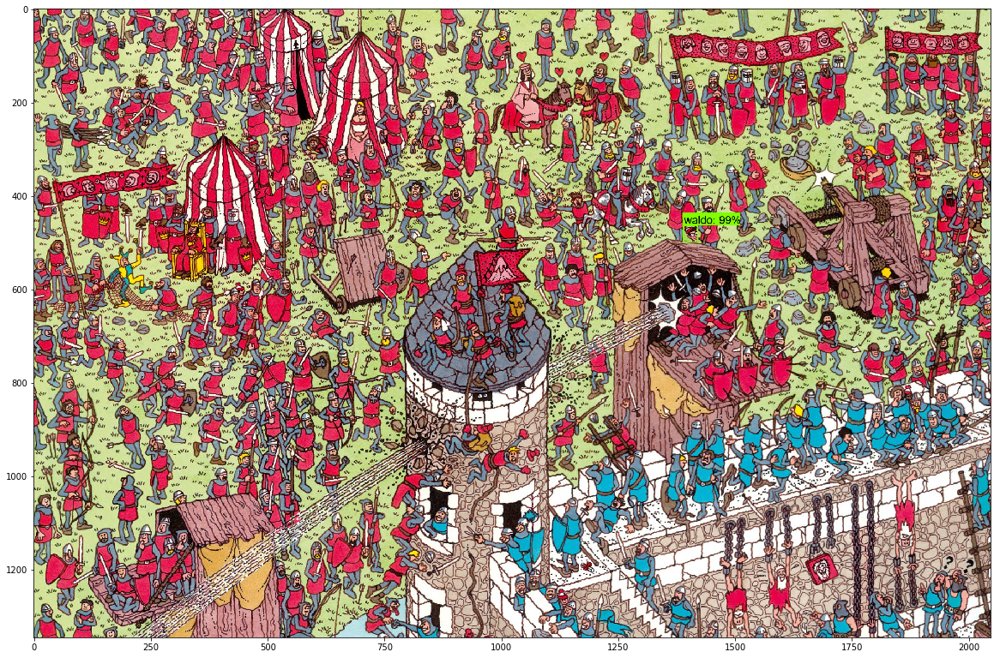

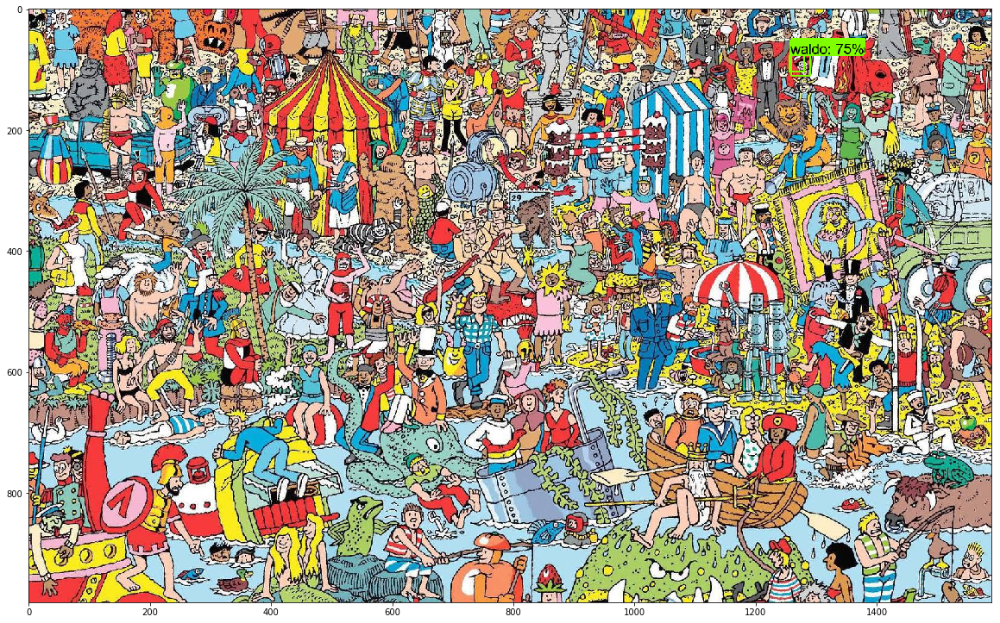

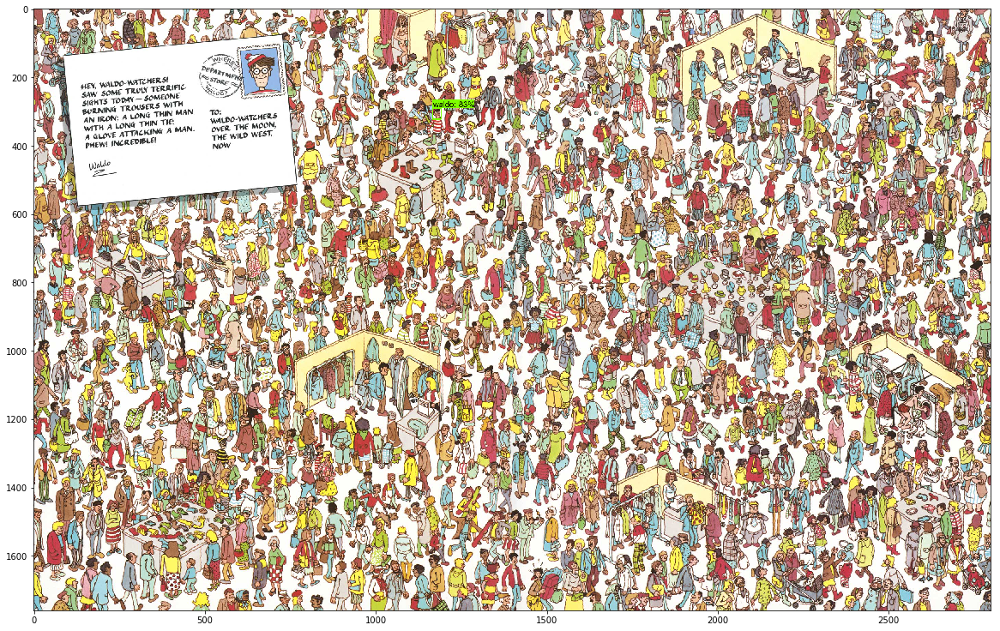

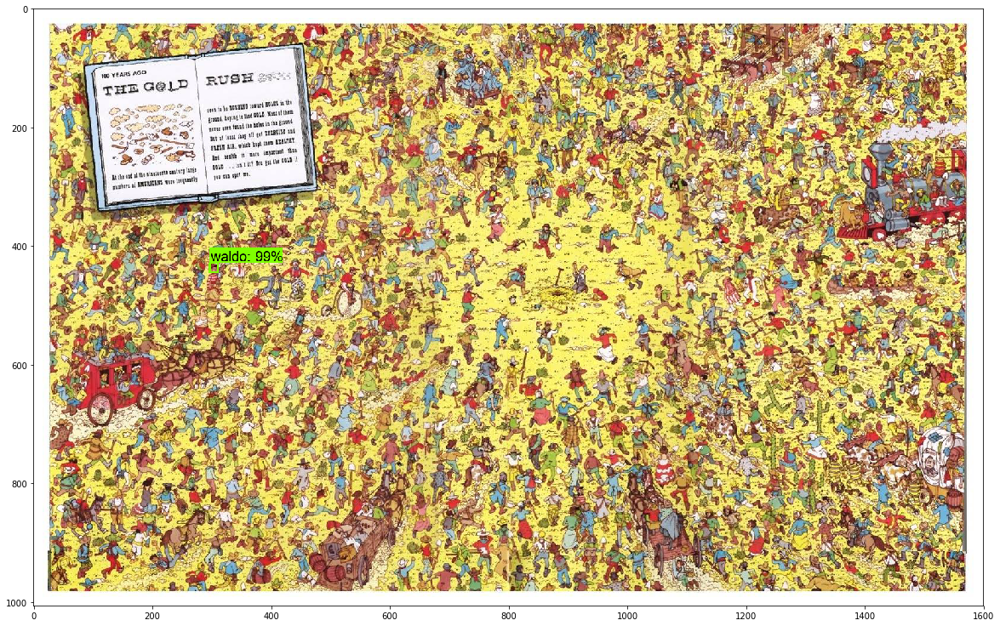

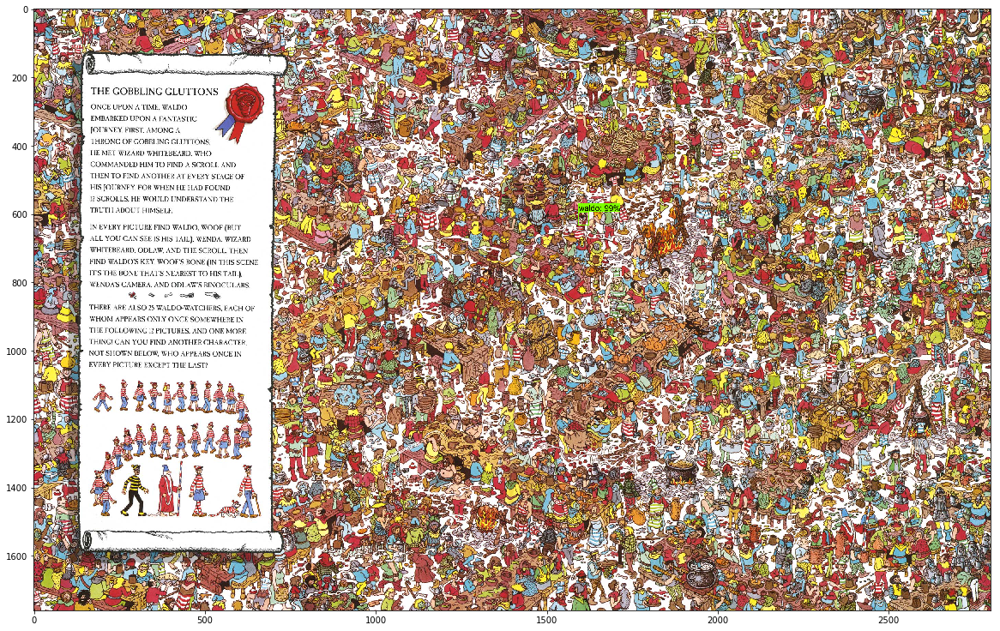

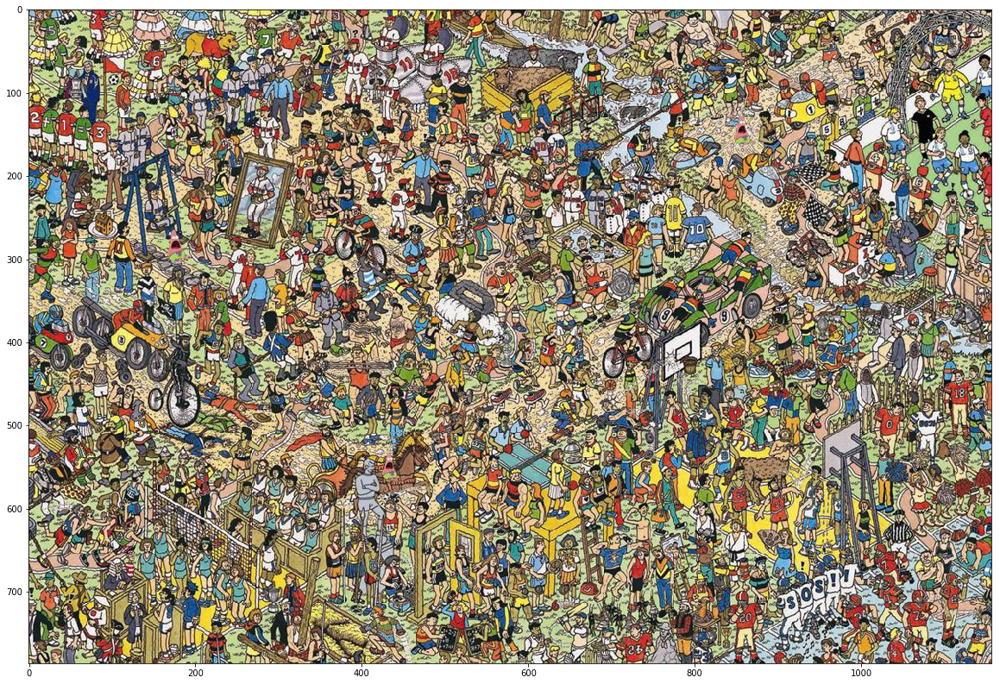

In [58]:
i = 0
for image_path in test_images_dir:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=3)
    
  plt.figure(figsize=IMAGE_SIZE)
  dir_image = './Results/'+str(i)+'.jpg'
  plt.savefig(dir_image)
  plt.imshow(image_np)
  fig1 = plt.gcf()
  plt.draw()
  fig1.savefig(dir_image, dpi=300)
  i+=1

The model detects Waldo very well except in the last picture, maybe we need to insert more images to train the model.